# Recommendations with IBM

In this notebook, as project part of the Udacity DataScience nanodegree course, we will build out a number of different methods for making recommendations that can be used for different situations. 


## Table of Contents

I. [Exploratory Data Analysis](#Exploratory-Data-Analysis)<br>
II. [Rank Based Recommendations](#Rank)<br>
III. [User-User Based Collaborative Filtering](#User-User)<br>
IV. [Matrix Factorization](#Matrix-Fact)<br>

Let's get started by importing the necessary libraries and reading in the data.

In [108]:
# 
# import libraries
#
import pandas as pd
import numpy as np
import project_tests as t
import pickle
from subprocess import call

import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# load data
try:
    df = pd.read_csv('data/user-item-interactions.csv')
    df_content = pd.read_csv('data/articles_community.csv')
    del df['Unnamed: 0']
    del df_content['Unnamed: 0']
except FileNotFoundError:
    file1 = 'user-item-interactions.csv'
    file2 = 'articles_community.csv'
    print("The csv files {}, {} don't exist in the given directory. No analysis possible.".format(file1, file2))
    
# success
print("The user-item dataset has {} data points with {} variables each.".format(*df.shape))
print("The articles-community dataset has {} data points with {} variables each.".format(*df_content.shape))

The user-item dataset has 45993 data points with 3 variables each.
The articles-community dataset has 1056 data points with 5 variables each.


In [3]:
# Show df to get an idea of the data
df.head()

,article_id,title,email
0,1430.0,"using pixiedust for fast, flexible, and easier...",ef5f11f77ba020cd36e1105a00ab868bbdbf7fe7
1,1314.0,healthcare python streaming application demo,083cbdfa93c8444beaa4c5f5e0f5f9198e4f9e0b
2,1429.0,use deep learning for image classification,b96a4f2e92d8572034b1e9b28f9ac673765cd074
3,1338.0,ml optimization using cognitive assistant,06485706b34a5c9bf2a0ecdac41daf7e7654ceb7
4,1276.0,deploy your python model as a restful api,f01220c46fc92c6e6b161b1849de11faacd7ccb2


In [4]:
# Show df_content to get an idea of the data
df_content.head()

,doc_body,doc_description,doc_full_name,doc_status,article_id
0,Skip navigation Sign in SearchLoading...\r\n\r...,Detect bad readings in real time using Python ...,Detect Malfunctioning IoT Sensors with Streami...,Live,0
1,No Free Hunch Navigation * kaggle.com\r\n\r\n ...,"See the forest, see the trees. Here lies the c...",Communicating data science: A guide to present...,Live,1
2,☰ * Login\r\n * Sign Up\r\n\r\n * Learning Pat...,Here’s this week’s news in Data Science and Bi...,"This Week in Data Science (April 18, 2017)",Live,2
3,"DATALAYER: HIGH THROUGHPUT, LOW LATENCY AT SCA...",Learn how distributed DBs solve the problem of...,DataLayer Conference: Boost the performance of...,Live,3
4,Skip navigation Sign in SearchLoading...\r\n\r...,This video demonstrates the power of IBM DataS...,Analyze NY Restaurant data using Spark in DSX,Live,4


### <a class="anchor" id="Exploratory-Data-Analysis">Part I : Exploratory Data Analysis</a>

Now, we provide some insight into the descriptive statistics of the data.

`1.` What is the distribution of how many articles a user interacts with in the dataset?  Provide a visual and descriptive statistics to assist with giving a look at the number of times each user interacts with an article.  

In [5]:
df_content.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1056 entries, 0 to 1055
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   doc_body         1042 non-null   object
 1   doc_description  1053 non-null   object
 2   doc_full_name    1056 non-null   object
 3   doc_status       1056 non-null   object
 4   article_id       1056 non-null   int64 
dtypes: int64(1), object(4)
memory usage: 41.4+ KB


In [6]:
sum(df_content.duplicated())

0

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45993 entries, 0 to 45992
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   article_id  45993 non-null  float64
 1   title       45993 non-null  object 
 2   email       45976 non-null  object 
dtypes: float64(1), object(2)
memory usage: 1.1+ MB


In [8]:
# see: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.astype.html
# change df article_id to int64, so, both dataframes are using the same datatype
df = df.astype({'article_id': 'int64'})
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45993 entries, 0 to 45992
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   article_id  45993 non-null  int64 
 1   title       45993 non-null  object
 2   email       45976 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.1+ MB


**Note:** As visible with this df information, there are 17 less emails compared to the number of article_id's and titles. So, there are 17 null email values.

In [9]:
sum(df.duplicated())

12311

In [10]:
interaction_dup_idx = df.index[df.duplicated()].tolist()

In [11]:
# Don't remove them now, it does not fit to the task 3 below and the sol_1_dict test function !

# but in general, remove the duplicates of the interaction dataset
#df.drop_duplicates(inplace=True)

In [12]:
#df.info()

# result: Now, there 13 less emails, means not all articles are mapped to an email interaction.
#<class 'pandas.core.frame.DataFrame'>
#Int64Index: 33682 entries, 0 to 45992
#Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
#---  ------      --------------  ----- 
# 0   article_id  33682 non-null  int64 
# 1   title       33682 non-null  object
# 2   email       33669 non-null  object
#dtypes: int64(1), object(2)
#memory usage: 1.0+ MB

In [13]:
print("There are {} different articles in the interaction dataset.".format(len(df['article_id'].unique())))
print("In the interaction dataset the smallest article number is: {}".format(min(df['article_id'].unique())))
print("In the interaction dataset the highest article number is: {}".format(max(df['article_id'].unique())))

There are 714 different articles in the interaction dataset.
In the interaction dataset the smallest article number is: 0
In the interaction dataset the highest article number is: 1444


In [14]:
print("There are {} different articles in the articles dataset.".format(len(df_content['article_id'].unique())))
print("In the article dataset the smallest article number is: {}".format(min(df['article_id'].unique())))
print("In the article dataset the highest article number is: {}".format(max(df['article_id'].unique())))

There are 1051 different articles in the articles dataset.
In the article dataset the smallest article number is: 0
In the article dataset the highest article number is: 1444


In [15]:
series_grouped1 = df.groupby(['article_id'])['email'].count()
series_grouped1[:20]

article_id
0      14
2      58
4      13
8      85
9      10
12    157
14     89
15     26
16     61
18     78
20    248
25     15
26     89
28     42
29     75
30     17
32     64
33    141
34     93
36     18
Name: email, dtype: int64

In [16]:
series_grouped1.values

array([ 14,  58,  13,  85,  10, 157,  89,  26,  61,  78, 248,  15,  89,
        42,  75,  17,  64, 141,  93,  18,  68,  70, 460,  11,  89, 124,
       115,  20, 140,  11,  13,  16,  20,  55,  29,  57,  69,  57,  11,
        57,  19,  24,  12,  18,  24,  38,   7, 152,   9,  89,  29,  78,
        28, 189, 198,  64,  68,  20,  28,  16, 160,  10, 130, 110, 325,
       127,  54,  75,  44,  10,  37,  75,  42,  26,  22,  33, 352,  59,
        85,  13,  38, 149, 222,  91,  12,  16,   9,  40,   7,  78,  33,
       124, 115,  21,  89,  63,  53, 113,  21, 113,  85,  41,  31,  33,
        68,  16,  20,  41, 198,  33,  48, 169,  37, 155,  42,  23,  46,
        59,  10,  15, 222,  44,  20, 146,  16,  24,  14,  60,  45,  24,
        38,  18,  41,  28,  18,  23,  34,  10,  84,  34,  15,  51,  60,
        90,  15,  18,  18,  65,   9,  85,  34,  19,  25,  22,  23,  85,
        43,   6,  19,  67,   5,  13,  33,  80,   3,   2,  11,  24,  93,
        11,   9,   2,  73,  29,  44,  10,   2,   4, 270,   3,  2

In [17]:
max(series_grouped1.values)

937

In [18]:
series_grouped1.idxmax()

1429

In [19]:
# visualise the article - user email count distribution
index_list = list(range(0, len(series_grouped1)))
interaction_dict = {
    'article_id': list(series_grouped1.index),
    'email_count': list(series_grouped1.values),
}
df_grouped1_interact = pd.DataFrame(data=interaction_dict,
                                   columns=['article_id', 'email_count'], index=index_list)
df_grouped1_interact = df_grouped1_interact.nlargest(len(series_grouped1), 'email_count')
df_grouped1_interact.head(10)

,article_id,email_count
699,1429,937
625,1330,927
701,1431,671
697,1427,643
652,1364,627
614,1314,614
600,1293,572
526,1170,565
518,1162,512
608,1304,483


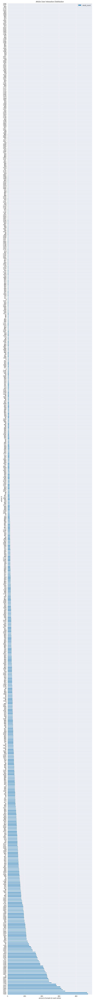

In [20]:
# Figure dimension (width, height) in inches
df_grouped1_interact.plot.barh(x='article_id', y='email_count', figsize=[10,120])
plt.title("Article User Interaction Distribution")
plt.ylabel('article id')
plt.xlabel('amount of emails for each article')
plt.show()

In [21]:
series_grouped2 = df.groupby(['article_id', 'email'])['email'].count()
series_grouped2[:20]

article_id  email                                   
0           2841916b462a2b89d36f4f95ca2d1f42559a5788    1
            384255292a8223e84f05ca1e1deaa450c993e148    3
            451a9a4a4cb1cc4e5f38d04e8859cc3fb275cc66    1
            74ca1ae8b034f7fad73a54d55fb1f58747f00493    1
            8bd0afc488016810c287ac4ec844895d570b0af4    1
            a60b7e945a8f2114d5dfbdd53182ad1d526534e2    1
            ad06c765d31179e56f309438367ecb30e1059620    1
            ca7d48adf2c7394ed5a8776de959fa8047e43d4b    1
            db8ac9b2f552db35750239ada8bfcb59b3ae48c0    1
            df722d3aac72766b93d4a65d8b4ac084a968d684    1
            e667c9a1cd56368dfa2f4b974ab2d848585552d7    1
            e6ed9e15addba353fe3c1f36d865a63fa254b9cc    1
2           0246d11c827f90850ce7062e9554c9d5eeb30027    1
            0286bfe26356436658cf4b29b232f0700f0bb9ce    2
            12815feeacc6f27dff5b3441a54418d2d51001ef    1
            12bb8a9740400ced27ae5a7d4c990ac3b7e3c77d    1
            15a1660

**Note:** As we have investigated, for a separate article is may appear that there are emails that are linked several times to this article and not only once. 

In [22]:
series_grouped3 = df.groupby(['email'])['article_id'].count()
series_grouped3

email
0000b6387a0366322d7fbfc6434af145adf7fed1    13
001055fc0bb67f71e8fa17002342b256a30254cd     4
00148e4911c7e04eeff8def7bbbdaf1c59c2c621     3
001a852ecbd6cc12ab77a785efa137b2646505fe     6
001fc95b90da5c3cb12c501d201a915e4f093290     2
                                            ..
ffc6cfa435937ca0df967b44e9178439d04e3537     2
ffc96f8fbb35aac4cb0029332b0fc78e7766bb5d     4
ffe3d0543c9046d35c2ee3724ea9d774dff98a32    32
fff9fc3ec67bd18ed57a34ed1e67410942c4cd81    10
fffb93a166547448a0ff0232558118d59395fecd    13
Name: article_id, Length: 5148, dtype: int64

In [23]:
df.query("email == '0000b6387a0366322d7fbfc6434af145adf7fed1'")

,article_id,title,email
498,1314,healthcare python streaming application demo,0000b6387a0366322d7fbfc6434af145adf7fed1
599,732,rapidly build machine learning flows with dsx,0000b6387a0366322d7fbfc6434af145adf7fed1
627,173,"10 must attend data science, ml and ai confere...",0000b6387a0366322d7fbfc6434af145adf7fed1
4635,1354,movie recommender system with spark machine le...,0000b6387a0366322d7fbfc6434af145adf7fed1
5689,43,deep learning with tensorflow course by big da...,0000b6387a0366322d7fbfc6434af145adf7fed1
5876,1232,country statistics: life expectancy at birth,0000b6387a0366322d7fbfc6434af145adf7fed1
7271,1162,analyze energy consumption in buildings,0000b6387a0366322d7fbfc6434af145adf7fed1
7363,124,python machine learning: scikit-learn tutorial,0000b6387a0366322d7fbfc6434af145adf7fed1
7372,1337,life expectancy at birth by country in total y...,0000b6387a0366322d7fbfc6434af145adf7fed1
8232,349,ibm data science experience white paper - spar...,0000b6387a0366322d7fbfc6434af145adf7fed1


In [24]:
# visualise the user email - article count distribution
index_list = list(range(0, len(series_grouped3)))
interaction_dict = {
    'email': list(series_grouped3.index),
    'article_id_count': list(series_grouped3.values),
}
df_grouped_interact = pd.DataFrame(data=interaction_dict,
                                   columns=['email', 'article_id_count'], index=index_list)
df_grouped_interact = df_grouped_interact.nlargest(len(series_grouped3), 'article_id_count')
df_grouped_interact.head(40)

,email,article_id_count
910,2b6c0f514c2f2b04ad3c4583407dccd0810469ee,364
2426,77959baaa9895a7e2bdc9297f8b27c1b6f2cb52a,363
985,2f5c7feae533ce046f2cb16fb3a29fe00528ed66,170
3312,a37adec71b667b297ed2440a9ff7dad427c7ac85,169
2680,8510a5010a5d4c89f5b07baac6de80cd12cfaf93,160
5005,f8c978bcf2ae2fb8885814a9b85ffef2f54c3c76,158
851,284d0c17905de71e209b376e3309c0b08134f7e2,148
525,18e7255ee311d4bd78f5993a9f09538e459e3fcc,147
4401,d9032ff68d0fd45dfd18c0c5f7324619bb55362c,147
832,276d9d8ca0bf52c780b5a3fc554fa69e74f934a3,145


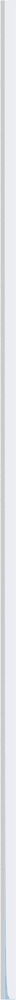

In [25]:
# Figure dimension (width, height) in inches
df_grouped_interact.plot.barh(x='email', y='article_id_count', figsize=[10,900])
plt.title("User Article Interaction Distribution")
plt.ylabel('email label')
plt.show()

Regarding the distribution as expected, the article user frequency is very low for most of them (expected is <5). There are only few having a high article interaction value >100 and only 2 >300. To get a better understanding, have a look to the statistical information below.

Both distributions (article-user email or user-email-article) show, that the dataset is imbalanced.

In [26]:
df_grouped_interact.describe()

,article_id_count
count,5148.000000
mean,8.930847
std,16.802267
min,1.000000
25%,1.000000
50%,3.000000
75%,9.000000
max,364.000000


Another question is: How many different article titles are there? This value should fit to the amount of unique article id's, which is 714, so, we can be pretty sure having a valid 1:1 mapping of article id and title information.

Afterwards a better visible diagram is plotted compared to the above ones to show the title distribution to emails, which are linked to users by now. We better visualise the median amount of user article interactions with this diagram.

In [27]:
len(df['title'].unique())

714

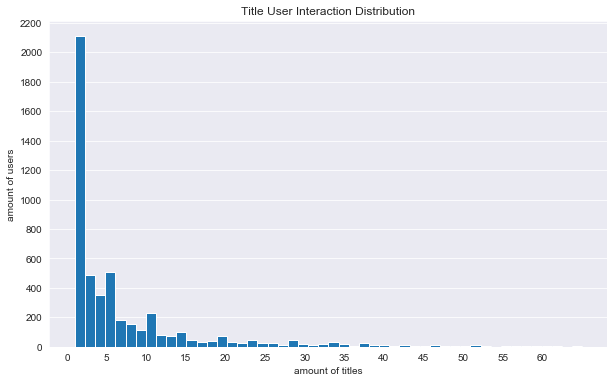

In [28]:
# create a new plot, better visible compared to the former ones by using bin arrangements,
# concentration of the skewed part, truncate the long empty tail up to 364 (range up to 60),
# y axis is set according the bar distribution and its hight
email_title_counts = df.groupby(['email'])['title'].count()
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(email_title_counts, bins=50, range=(1, 65))
ax.set_xticks(np.arange(0, 65, 5))
ax.set_yticks(np.arange(0, 2400, 200))
# use only the y axis grid lines to get a better visibility
ax.grid(which='major', axis='x')
plt.title("Title User Interaction Distribution")
plt.xlabel('amount of titles')
plt.ylabel('amount of users');

**Note:**<br>
Regarding the next given task - Fill in the median and maximum number of user_article interactios below - and having the investigation about emails and articles/titles above, it is unclear, if each email can be mapped to a different user and to exclude the use case that some emails are from the same user. For each article id there exists a list of emails with mostly different string values.

No dataframe file includes a list of user id's, which would be helpful to distinguish such user use cases.

So as simplification, for the next task we assume that each different email string value is mapped to a different user. Additionally, as interaction with an article we count each email independent if it is from a different or the same user as before.

In [29]:
# Fill in the median and maximum number of user_article interactios below
median_val = int(df.groupby(['email'])['article_id'].count().median())
print("50% of individuals interact with {} number of articles or fewer.".format(median_val))

max_views_by_user = df.groupby(['email'])['article_id'].count().max()
print("The maximum number of user-article interactions by any 1 user is: {}.".format(max_views_by_user))

50% of individuals interact with 3 number of articles or fewer.
The maximum number of user-article interactions by any 1 user is: 364.


`2.` Explore and remove duplicate articles from the **df_content** dataframe.  

In [30]:
sum(df_content.duplicated(subset='article_id'))

5

In [31]:
# Find and explore duplicate articles
# see: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.duplicated.html?highlight=duplicated#pandas.DataFrame.duplicated
# as default 'first' is set: Mark duplicates as True except for the first occurrence.
article_dup_idx = df_content.index[df_content.duplicated(subset='article_id')].tolist()
article_dup_idx

[365, 692, 761, 970, 971]

In [32]:
# to show the whole string content and not a truncated one
pd.set_option('display.max_colwidth', None)

print("Information about the duplicated articles ...\n")
for idx in article_dup_idx:
    print("\033[1mDuplicate: {}\033[0m".format(idx))
    print("\033[1mArticle ID: {}\033[0m".format(df_content.iloc[idx]['article_id']))
    print(df_content.iloc[idx])

Information about the duplicated articles ...

Duplicate: 365
Article ID: 50
doc_body           Follow Sign in / Sign up Home About Insight Data Science Data Engineering Health Data AI 5 * Share\r\n * 5\r\n * \r\n * \r\n\r\nNever miss a story from Insight Data , when you sign up for Medium. Learn more Never miss a story from Insight Data Get updates Get updates Sebastien Dery Blocked Unblock Follow Following Master of Layers, Protector of the Graph, Wielder of Knowledge. #OpenScience\r\n#NoBullshit 2 days ago\r\n--------------------------------------------------------------------------------\r\n\r\nGRAPH-BASED MACHINE LEARNING: PART 2\r\nCOMMUNITY DETECTION AT SCALE\r\nDuring the seven-week Insight Data Engineering Fellows Program recent grads and experienced software engineers learn the latest open source technologies by building a data platform to handle large, real-time datasets.\r\n\r\nSebastien Dery (now a Data Science Engineer at Yewno ) discusses his project on community detecti

As we have investigated there are 5 different, duplicate articles, which can be removed from this dataset. By default, already the first article occurence is not marked as being a duplicate. It remains in the dataset.

In [33]:
# Remove any rows that have the same article_id - only keep the first
df_content.drop_duplicates(subset='article_id', inplace=True)
df_content.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1051 entries, 0 to 1055
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   doc_body         1037 non-null   object
 1   doc_description  1048 non-null   object
 2   doc_full_name    1051 non-null   object
 3   doc_status       1051 non-null   object
 4   article_id       1051 non-null   int64 
dtypes: int64(1), object(4)
memory usage: 49.3+ KB


In [34]:
# string content as a whole; are there icons as well? => yes, see second item: some emoticons
df_content.head(2)

doc_body  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

`3.` Use the cells below to find:

**a.** The number of unique articles that have an interaction with a user.  
**b.** The number of unique articles in the dataset (whether they have any interactions or not).<br>
**c.** The number of unique users in the dataset. (excluding null values) <br>
**d.** The number of user-article interactions in the dataset.

In [35]:
unique_articles = len(df['article_id'].unique())
print("The number of unique articles that have at least one interaction: {}".format(unique_articles))
total_articles = df_content.shape[0]
print("The number of unique articles on the IBM platform: {}".format(total_articles))
unique_users = len(df['email'].dropna().unique())
print("The number of unique users: {}".format(unique_users))
user_article_interactions = df.shape[0]
print("The number of user-article interactions: {}".format(user_article_interactions))

The number of unique articles that have at least one interaction: 714
The number of unique articles on the IBM platform: 1051
The number of unique users: 5148
The number of user-article interactions: 45993


`4.` Use the cells below to find the most viewed **article_id**, as well as how often it was viewed.  After talking to the company leaders, the `email_mapper` function was deemed a reasonable way to map users to ids.  There were a small number of null values, and it was found that all of these null values likely belonged to a single user (which is how they are stored using the function below).

In [36]:
most_viewed_article_id = str(float(series_grouped1.idxmax()))
print("The most viewed article in the dataset, id as a string with one value following the decimal: {}".
      format(most_viewed_article_id))
max_views = max(series_grouped1.values)
print("The most viewed article in the dataset was viewed how many times? answer: {}".format(max_views))

The most viewed article in the dataset, id as a string with one value following the decimal: 1429.0
The most viewed article in the dataset was viewed how many times? answer: 937


In [37]:
# This will be helpful for later parts of the notebook
# Run this cell to map the user email to a user_id column and remove the email column

def email_mapper():
    coded_dict = dict()
    cter = 1
    email_encoded = []
    
    for val in df['email']:
        if val not in coded_dict:
            coded_dict[val] = cter
            cter+=1
        
        email_encoded.append(coded_dict[val])
    return email_encoded

email_encoded = email_mapper()
del df['email']
df['user_id'] = email_encoded

# show header
df.head()

,article_id,title,user_id
0,1430,"using pixiedust for fast, flexible, and easier data analysis and experimentation",1
1,1314,healthcare python streaming application demo,2
2,1429,use deep learning for image classification,3
3,1338,ml optimization using cognitive assistant,4
4,1276,deploy your python model as a restful api,5


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45993 entries, 0 to 45992
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   article_id  45993 non-null  int64 
 1   title       45993 non-null  object
 2   user_id     45993 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.1+ MB


In [39]:
def get_ordered_article_usercounts(df=df):
    '''
    Creates a new dataframe grouped by article id's and descending ordered user counts.
    
    Input:
        df - modified dataframe with attributes 'article_id', 'title', 'user_id'
    Output:
        df - descending ordered dataframe with attributes 'article_id' and 'user_count'
    '''
    
    # create a new ordered, grouped dataframe with this modified df file
    srs_grpd_dfmod = df.groupby(['article_id'])['user_id'].count()
    
    # create the new ordered dataframe
    index_list = list(range(0, len(srs_grpd_dfmod)))
    interaction_dict = {
        'article_id': list(srs_grpd_dfmod.index),
        'user_count': list(srs_grpd_dfmod.values),
    }
    df_mod_ordered = pd.DataFrame(data=interaction_dict,
                          columns=['article_id', 'user_count'], index=index_list)
    df_mod_ordered = df_mod_ordered.nlargest(len(srs_grpd_dfmod), 'user_count')
    
    
    return df_mod_ordered

In [40]:
df_ordered = get_ordered_article_usercounts(df=df)
df_ordered.head(10)

,article_id,user_count
699,1429,937
625,1330,927
701,1431,671
697,1427,643
652,1364,627
614,1314,614
600,1293,572
526,1170,565
518,1162,512
608,1304,483


In [41]:
# get the first 5 article ids
df_ordered['article_id'][0:5].to_list()

[1429, 1330, 1431, 1427, 1364]

In [42]:
df.query('article_id == 1429')

,article_id,title,user_id
2,1429,use deep learning for image classification,3
6,1429,use deep learning for image classification,7
41,1429,use deep learning for image classification,3
75,1429,use deep learning for image classification,7
80,1429,use deep learning for image classification,40
...,...,...,...
45147,1429,use deep learning for image classification,3968
45153,1429,use deep learning for image classification,3968
45156,1429,use deep learning for image classification,3968
45190,1429,use deep learning for image classification,5077


In [43]:
## If you stored all your results in the variable names above, 
## you shouldn't need to change anything in this cell

sol_1_dict = {
    '`50% of individuals have _____ or fewer interactions.`': median_val,
    '`The total number of user-article interactions in the dataset is ______.`': user_article_interactions,
    '`The maximum number of user-article interactions by any 1 user is ______.`': max_views_by_user,
    '`The most viewed article in the dataset was viewed _____ times.`': max_views,
    '`The article_id of the most viewed article is ______.`': most_viewed_article_id,
    '`The number of unique articles that have at least 1 rating ______.`': unique_articles,
    '`The number of unique users in the dataset is ______`': unique_users,
    '`The number of unique articles on the IBM platform`': total_articles,
}

# Test your dictionary against the solution
t.sol_1_test(sol_1_dict)

It looks like you have everything right here! Nice job!


### <a class="anchor" id="Rank">Part II: Rank-Based Recommendations</a>

Unlike in the earlier lessons, we don't actually have ratings for whether a user liked an article or not.  We only know that a user has interacted with an article.  In these cases, the popularity of an article can really only be based on how often an article was interacted with.

`1.` Fill in the function below to return the **n** top articles ordered with most interactions as the top. Test your function using the tests below.

In [44]:
def get_top_articles(n, df=df):
    '''
    Returns the top n article titles.
    
    Input:
        n - (int) the number of top articles to return
        df - (pandas dataframe) df as defined at the top of the notebook 
    
    Output:
        top_articles - (list) A list of the top 'n' article titles    
    '''
    top_articles = []
    
    # get the n article ids
    n_art_ids = get_top_article_ids(n, df)
    
    # list of article titles: get first occurence and separate the title string from object item
    for a_id in n_art_ids:
        title = str(df.query('article_id == {}'.format(a_id)).head(1)['title'])
        title = title.replace("\nName: title, dtype: object", "").partition("    ")[2]
        top_articles.append(title)
    
    return top_articles # Return the top article titles from df (not df_content)


def get_top_article_ids(n, df=df):
    '''
    Returns the top n article id numbers.
    
    Input:
        n - (int) the number of top articles to return
        df - (pandas dataframe) df as defined at the top of the notebook 
    
    Output:
        top_articles_ids - (list) A list of the top 'n' article id's     
    '''
    
    df_ordered = get_ordered_article_usercounts(df=df)
    top_articles_ids = df_ordered['article_id'][0:n].to_list()
 
    return top_articles_ids # Return the top article ids

In [45]:
print("\033[1mGet Top Article Titles List:\033[0m")
print(get_top_articles(10))
print("\n\033[1mGet Top Article IDs List:\033[0m")
print(get_top_article_ids(10))

Get Top Article Titles List:
['use deep learning for image classification', 'insights from new york car accident reports', 'visualize car data with brunel', 'use xgboost, scikit-learn & ibm watson machine learning apis', 'predicting churn with the spss random tree algorithm', 'healthcare python streaming application demo', 'finding optimal locations of new store using decision optimization', 'apache spark lab, part 1: basic concepts', 'analyze energy consumption in buildings', 'gosales transactions for logistic regression model']

Get Top Article IDs List:
[1429, 1330, 1431, 1427, 1364, 1314, 1293, 1170, 1162, 1304]


In [46]:
# Test your function by returning the top 5, 10, and 20 articles
top_5 = get_top_articles(5)
top_10 = get_top_articles(10)
top_20 = get_top_articles(20)

# Test each of your three lists from above
t.sol_2_test(get_top_articles)

Your top_5 looks like the solution list! Nice job.
Your top_10 looks like the solution list! Nice job.
Your top_20 looks like the solution list! Nice job.


### <a class="anchor" id="User-User">Part III: User-User Based Collaborative Filtering</a>


`1.` Use the function below to reformat the **df** dataframe to be shaped with users as the rows and articles as the columns.  

* Each **user** should only appear in each **row** once.


* Each **article** should only show up in one **column**.  


* **If a user has interacted with an article, then place a 1 where the user-row meets for that article-column**.  It does not matter how many times a user has interacted with the article, all entries where a user has interacted with an article should be a 1.  


* **If a user has not interacted with an item, then place a zero where the user-row meets for that article-column**. 

Use the tests to make sure the basic structure of the matrix matches what is expected by the solution.

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45993 entries, 0 to 45992
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   article_id  45993 non-null  int64 
 1   title       45993 non-null  object
 2   user_id     45993 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.1+ MB


In [48]:
df.head()

,article_id,title,user_id
0,1430,"using pixiedust for fast, flexible, and easier data analysis and experimentation",1
1,1314,healthcare python streaming application demo,2
2,1429,use deep learning for image classification,3
3,1338,ml optimization using cognitive assistant,4
4,1276,deploy your python model as a restful api,5


In [49]:
df.groupby(['user_id', 'article_id'])['article_id'].count()

user_id  article_id
1        43            1
         109           1
         151           1
         268           1
         310           2
                      ..
5146     1394          1
         1416          1
5147     233           1
5148     1160          1
5149     16            1
Name: article_id, Length: 33682, dtype: int64

In [50]:
user_item = df.groupby(['user_id', 'article_id'])['article_id'].count().unstack()
user_item

article_id,0,2,4,8,9,12,14,15,16,18,...,1434,1435,1436,1437,1439,1440,1441,1442,1443,1444
user_id,,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [51]:
user_item.shape

(5149, 714)

In [52]:
type(user_item)

pandas.core.frame.DataFrame

In [53]:
user_item.iloc[0,0]

nan

In [54]:
np.isnan(user_item.iloc[0,0])

True

In [55]:
user_item.iloc[0, 0] = 0
user_item

article_id,0,2,4,8,9,12,14,15,16,18,...,1434,1435,1436,1437,1439,1440,1441,1442,1443,1444
user_id,,,,,,,,,,,,,,,,,,,,,
1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [56]:
type(user_item.iloc[0, 0])

numpy.float64

In [57]:
user_item.columns[713]

1444

In [58]:
user_item.shape[1]-1

713

In [59]:
# shall be value of user_id=3, article_id=12 which is: 1.0 > 0 = True
print("article_id: {}".format(user_item.columns[5]))
user_item.iloc[2, 5] > 0

article_id: 12


True

In [60]:
def create_user_item_matrix(df):
    '''
    Creates the user-article matrix with 1's and 0's.
    
    Input:
        df - pandas dataframe with article_id, title, user_id columns
    
    Output:
        user_item - (dataframe) user item matrix 
    
    Description:
    Return a matrix with user id's as rows and article id's on the columns with 1 values where
    a user interacted with an article and a 0 otherwise.
    '''
    
    # Create user-by-item matrix, the user_item is a dataframe object
    user_item = df.groupby(['user_id', 'article_id'])['article_id'].count().unstack()
    
    # future toDo: more python like creation with lambda function
    for i in range(0, user_item.shape[0]):         # user id row iteration
        for j in range(0, user_item.shape[1]):     # article id column iteration
            if np.isnan(user_item.iloc[i, j]):
                user_item.iloc[i, j] = 0
            elif user_item.iloc[i, j] > 0:
                #print("i: {}, j: {}, i-j pos value: {}".format((i), j, user_item.iloc[i,j]))
                user_item.iloc[i, j] = 1
    
    # return the user_item matrix with integer values; the added values are by default float dtype
    return user_item.astype('int64')

In [61]:
user_item = create_user_item_matrix(df)
user_item

article_id,0,2,4,8,9,12,14,15,16,18,...,1434,1435,1436,1437,1439,1440,1441,1442,1443,1444
user_id,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5145,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5146,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5147,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [62]:
## Tests: You should just need to run this cell.  Don't change the code.
assert user_item.shape[0] == 5149, "Oops!  The number of users in the user-article matrix doesn't look right."
assert user_item.shape[1] == 714, "Oops!  The number of articles in the user-article matrix doesn't look right."
assert user_item.sum(axis=1)[1] == 36, "Oops!  The number of articles seen by user 1 doesn't look right."
print("You have passed our quick tests!  Please proceed!")

You have passed our quick tests!  Please proceed!


`2.` Now, we want ot find similar users. The function below takes a user_id and provides an ordered list of the most similar users to that user (from most similar to least similar). The returned result does not contain the provided user_id, as we know that each user is similar to him/herself. 

Regarding the similarity of users, we don't have ranking information by now. Therefore, we can use the user-article interaction only. Because the results for each user here are binary, it makes sense to compute similarity as the dot product of two users. 

In [63]:
def find_similar_users(user_id, user_item=user_item):
    '''
    Searches similar users to the given one.
    
    Input:
        user_id - (int) a user_id
        user_item - (pandas dataframe) matrix of users by articles: 
                    1's when a user has interacted with an article, 0 otherwise
    
    Output:
        similar_users - (list) an ordered list where the closest users (largest dot product users)
                        are listed first
    
    Description:
    Computes the similarity of every pair of users based on the dot product and 
    returns an ordered list. 
    If the user_id does not exist in the user-item matrix, the return list is empty.   
    '''
    
    # regarding assert tests: if a (float) string value is given as user_id, create an int out of it
    user_id = int(float(user_id))
    
    most_similar_users = []
    
    if user_id in user_item.index:
        # compute similarity of each user to the provided user,
        # don't use np.dot() because we want to sort the values afterwards which is easier with pandas
        similarity = user_item.dot(user_item.loc[user_id])

        # sort by similarity
        similarity = similarity.sort_values(ascending=False)

        # remove the own user's id
        similarity.drop(user_id, inplace=True)

        # create list of just the ids
        most_similar_users = similarity.index.to_list()   
       
    # return a list of the users in order from most to least similar
    return most_similar_users      

In [64]:
# Do a spot check of your function
print("The 10 most similar users to user 1 are: {}".format(find_similar_users(1)[:10]))
print("The 5 most similar users to user 3933 are: {}".format(find_similar_users(3933)[:5]))
print("The 3 most similar users to user 46 are: {}".format(find_similar_users(46)[:3]))

The 10 most similar users to user 1 are: [3933, 23, 3782, 203, 4459, 131, 3870, 46, 4201, 5041]
The 5 most similar users to user 3933 are: [1, 23, 3782, 4459, 203]
The 3 most similar users to user 46 are: [4201, 23, 3782]


`3.` Now that we have a function that provides the most similar users to each user, we want to use these users to find articles we would recommend to each user. 

In [65]:
def get_article_names(article_ids, df=df):
    '''
    Returns the article titles of the given article id's.
    
    Input:
        article_ids - (list) a list of article id's
        df - (pandas dataframe) df as defined at the top of the notebook
    
    Output:
        article_names - (list) a list of article names associated with the list of article id's 
                        (this is identified by the title column); 
                        the list is empty if the article id's don't exist.
    '''
    article_names = []
       
    # list of article titles: get first occurence and separate the title string from object item
    for a_id in article_ids:
        title = str(df.query('article_id == {}'.format(a_id)).head(1)['title'])
        title = title.replace("\nName: title, dtype: object", "").partition("    ")[2]
        article_names.append(title)
    
    # Return the article names associated with list of article ids
    return article_names  

In [66]:
# 2 examples from below assert part
get_article_names([1024.0, 1176.0])

['using deep learning to reconstruct high-resolution audio',
 'build a python app on the streaming analytics service']

In [67]:
user = user_item.query("user_id == {}".format(1))
user

article_id,0,2,4,8,9,12,14,15,16,18,...,1434,1435,1436,1437,1439,1440,1441,1442,1443,1444
user_id,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0


In [68]:
series_user_items = user_item.loc[1]
series_user_items

article_id
0       0
2       0
4       0
8       0
9       0
       ..
1440    0
1441    0
1442    0
1443    0
1444    0
Name: 1, Length: 714, dtype: int64

In [69]:
# index positions of values being 1
np.where(series_user_items.isin([1]))

(array([ 22,  54,  76, 123, 138, 147, 152, 178, 222, 235, 253, 267, 285,
        315, 329, 374, 401, 408, 438, 526, 538, 540, 566, 600, 609, 651,
        656, 665, 672, 678, 697, 699, 700, 701, 706, 708], dtype=int64),)

In [70]:
# get series part with values being 1, having the expected index
series_user_items[series_user_items.isin([1])]

article_id
43      1
109     1
151     1
268     1
310     1
329     1
346     1
390     1
494     1
525     1
585     1
626     1
668     1
732     1
768     1
910     1
968     1
981     1
1052    1
1170    1
1183    1
1185    1
1232    1
1293    1
1305    1
1363    1
1368    1
1391    1
1400    1
1406    1
1427    1
1429    1
1430    1
1431    1
1436    1
1439    1
Name: 1, dtype: int64

In [71]:
def get_user_articles(user_id, user_item=user_item):
    '''
    Returns the list of article id's and its associated titles for a given user.
    
    Input:
        user_id - (int) a user id
        user_item - (pandas dataframe) matrix of users by articles: 
                    1's when a user has interacted with an article, 0 otherwise
    
    Output:
        article_ids - (list) a list of the article ids seen by the user
        article_names - (list) a list of article names associated with the list of article id's 
                        (this is identified by the doc_full_name column in df_content)
    
    Description:
    Provides a list of the article_ids and article titles that have been seen by a user.
    The lists are empty if the given user id does not exist in the user-item matrix.
    '''
    # regarding assert tests: if a (float) string value is given as user_id, create an int out of it
    user_id = int(float(user_id))
    
    article_ids = []
    article_names = []
    
    if user_id in user_item.index:
        series_user_items = user_item.loc[user_id]
        article_ids = series_user_items[series_user_items.isin([1])].index.to_list()
        article_names = get_article_names(article_ids)
    
    # return the ids and names
    #print(type(article_ids[0]), type(article_names[0])) - throws the output: <class 'int'> <class 'str'>
    return article_ids, article_names 

In [72]:
get_user_articles(20)

([232, 844, 1320],
 ['self-service data preparation with ibm data refinery',
  'use the cloudant-spark connector in python notebook',
  'housing (2015): united states demographic measures'])

In [73]:
def user_user_recs(user_id, m=10):
    '''
    Returns a list of 'm' article id's recommended to the given user which the user has not seen before.
    
    Input:
        user_id - (int) a user id
        m - (int) the number of recommendations you want for the user
    
    Output:
        recs - (list) a list of recommendations for the user
    
    Description:
    Loops through the users based on closeness to the input user_id.
    For each user - finds articles the user hasn't seen before and provides them as recs.
    Does this until m recommendations are found.
    
    Notes:
    Users who are the same closeness are chosen arbitrarily as the 'next' user.
    
    For the user where the number of recommended articles starts below m 
    and ends exceeding m, the last items are chosen arbitrarily.  
    
    If the given user id does not exist in the user-item matrix, available in the background,
    the output recs list is empty.
    '''
    
    # regarding assert tests: if a (float) string value is given as user_id, create an int out of it
    user_id = int(float(user_id))
    
    recs = []
    similar_users = find_similar_users(user_id)
    user_articles_ids, user_articles_names = get_user_articles(user_id)
    
    for similar_user in similar_users:
        similar_user_articles_ids, _ = get_user_articles(similar_user)
        if len(recs) < m:
            # subtract is not possible because the arrays have different length
            # movie_ids_diffs = np.subtract(user_articles_ids, similar_user_articles_ids)
            # so see: https://www.w3resource.com/python-exercises/numpy/python-numpy-exercise-20.php
            article_ids_diffs = np.setdiff1d(similar_user_articles_ids, user_articles_ids)
            # see: https://docs.scipy.org/doc/numpy/reference/generated/numpy.unique.html#numpy.unique
            recs = np.unique(np.concatenate([recs, article_ids_diffs], axis=0))
    
    if len(recs) > m:
        recs = recs[0:m]       
    
    # return your recommendations for this user_id 
    return recs   

In [74]:
# Check Results
# Return 10 recommendations for user 1
get_article_names(user_user_recs(1, 10))

['this week in data science (april 18, 2017)',
 'timeseries data analysis of iot events by using jupyter notebook',
 'got zip code data? prep it for analytics. – ibm watson data lab – medium',
 'higher-order logistic regression for large datasets',
 'using machine learning to predict parking difficulty',
 'deep forest: towards an alternative to deep neural networks',
 'experience iot with coursera',
 'using brunel in ipython/jupyter notebooks',
 'graph-based machine learning',
 'the 3 kinds of context: machine learning and the art of the frame']

In [75]:
# Test your functions here - No need to change this code - just run this cell
#  Note:
#  In this part Udacity wrote id's as strings for the set() function,
#  which leads the asserts to fail (throws AssertionError).
#  So, I changed this id strings to float numbers in this assert part!
#  The get_user_articles() gets the same result, but with different order, its id-title mapping is correct.
#  Therefore I tested the third assert statement with the given number order and a changed order.
#  Both resulted in the same assert answer to be correct.
#
assert set(get_article_names(['1024.0', '1176.0', '1305.0', '1314.0', '1422.0', '1427.0'])) == set(['using deep learning to reconstruct high-resolution audio', 'build a python app on the streaming analytics service', 'gosales transactions for naive bayes model', 'healthcare python streaming application demo', 'use r dataframes & ibm watson natural language understanding', 'use xgboost, scikit-learn & ibm watson machine learning apis']), "Oops! Your the get_article_names function doesn't work quite how we expect."
assert set(get_article_names(['1320.0', '232.0', '844.0'])) == set(['housing (2015): united states demographic measures','self-service data preparation with ibm data refinery','use the cloudant-spark connector in python notebook']), "Oops! Your the get_article_names function doesn't work quite how we expect."
assert set(get_user_articles(20)[0]) == set([1320.0, 232.0, 844.0])  #set(['1320.0', '232.0', '844.0'])
assert set(get_user_articles(20)[1]) == set(['housing (2015): united states demographic measures', 'self-service data preparation with ibm data refinery','use the cloudant-spark connector in python notebook'])
assert set(get_user_articles(2)[0]) == set([1024.0, 1176.0, 1305.0, 1314.0, 1422.0, 1427.0])
assert set(get_user_articles(2)[1]) == set(['using deep learning to reconstruct high-resolution audio', 'build a python app on the streaming analytics service', 'gosales transactions for naive bayes model', 'healthcare python streaming application demo', 'use r dataframes & ibm watson natural language understanding', 'use xgboost, scikit-learn & ibm watson machine learning apis'])
print("If this is all you see, you passed all of our tests!  Nice job!")

If this is all you see, you passed all of our tests!  Nice job!


`4.` Now we are going to improve the consistency of the **user_user_recs** function from above.  

* Instead of arbitrarily choosing when we obtain users who are all the same closeness to a given user - choose the users that have the most total article interactions before choosing those with fewer article interactions.


* Instead of arbitrarily choosing articles from the user where the number of recommended articles starts below m and ends exceeding m, choose articles with the articles with the most total interactions before choosing those with fewer total interactions. This ranking should be  what would be obtained from the **top_articles** function we wrote earlier.

In [76]:
df['user_id'].value_counts()

23      364
3782    363
98      170
3764    169
203     160
       ... 
1039      1
3150      1
1103      1
3182      1
2049      1
Name: user_id, Length: 5149, dtype: int64

In [77]:
type(df['user_id'].value_counts())

pandas.core.series.Series

In [78]:
(df['user_id'].value_counts()).drop(labels=[23])

3782    363
98      170
3764    169
203     160
4459    158
       ... 
1039      1
3150      1
1103      1
3182      1
2049      1
Name: user_id, Length: 5148, dtype: int64

In [79]:
def get_top_sorted_users(user_id, df=df, user_item=user_item):
    '''
    Returns a dataframe with ordered similar users to the given user id and
    their similarity and article interaction count information.
    
    Input:
        user_id - (int) a user id
        df - (pandas dataframe) df as defined at the top of the notebook 
        user_item - (pandas dataframe) matrix of users by articles: 
                1's when a user has interacted with an article, 0 otherwise
    
            
    Output:
        neighbors_df - (pandas dataframe) a dataframe with:
                        neighbor_id - is a neighbor user_id
                        similarity - measure of the similarity of each user to the provided user_id
                        num_interactions - the number of articles viewed by the user;
                        if the user_id does not exist the output dataframe includes the column labels only.
                    
    Other Details - sort the neighbors_df by the similarity and then by number of interactions where 
                    highest of each is higher in the dataframe   
    '''
    
    # regarding assert tests: if a (float) string value is given as user_id, create an int out of it
    user_id = int(float(user_id))
    
    # for the resulting neighbors_df we have to calculated the specific column parts seperatly
    # and cannot user the find_similar_users() function
    neighbors_df = pd.DataFrame(columns=['neighbor_id', 'similarity', 'num_interactions']) 
    
    if user_id in user_item.index:
        # compute similarity of each user to the provided user
        similarity = user_item.dot(user_item.loc[user_id])  
        # sort by similarity, remove the own user's id
        similarity = similarity.sort_values(ascending=False).drop(user_id)

        # compute the interaction article numbers of the given user,
        # remove the own user's id from the series object instance
        num_interaction = (df['user_id'].value_counts()).drop(labels=user_id)

        df_neighbors_dict = {
            'similarity': similarity,
            'num_interactions': num_interaction,
        }

        neighbors_df = pd.DataFrame(df_neighbors_dict)
        neighbors_df = neighbors_df.sort_values(by=['similarity', 'num_interactions'], ascending=False)
        neighbors_df = neighbors_df.reset_index()
        neighbors_df = neighbors_df.rename(columns={'index': 'neighbor_id'})
        
    
    # Return the dataframe specified in the doc_string
    return neighbors_df

In [80]:
# example for user id 1  (used for testing below)
example_user_1 = get_top_sorted_users(1)
example_user_1

,neighbor_id,similarity,num_interactions
0,3933,35,45
1,23,17,364
2,3782,17,363
3,203,15,160
4,4459,15,158
...,...,...,...
5143,5141,0,1
5144,5144,0,1
5145,5147,0,1
5146,5148,0,1


In [81]:
# example 2
example_user_notExist = get_top_sorted_users(6000)
print("dataframe size for empty df shall be zero and it is: {}\nDataframe structure is:\n".
      format(example_user_notExist.size))
example_user_notExist

dataframe size for empty df shall be zero and it is: 0
Dataframe structure is:



,neighbor_id,similarity,num_interactions


In [82]:
def user_user_recs_part2(user_id, m=10):
    '''
    Returns an ordered list of 'm' article id's recommended to the given user
    which the user has not seen before.
    
    Input:
        user_id - (int) a user id
        m - (int) the number of recommendations you want for the user
    
    Output:
        recs - (list) a list of recommendations for the user by article id's
        rec_names - (list) a list of recommendations for the user by article title
    
    Description:
    Loops through the users based on closeness to the input user_id.
    For each user - finds articles the user hasn't seen before and provides them as recs.
    Does this until m recommendations are found.
    
    Notes:
    * Choose the users that have the most total article interactions 
    before choosing those with fewer article interactions.

    * Choose articles with the articles with the most total interactions 
    before choosing those with fewer total interactions. 
    '''
    
    # regarding assert tests: if a (float) string value is given as user_id, create an int out of it
    user_id = int(float(user_id))
    
    recs = []    
    user_articles_ids, user_articles_names = get_user_articles(user_id)
    
    if len(user_articles_ids) == 0:  # user id does not exist in user-item matrix
        recs = get_top_article_ids(m)
        rec_names = get_article_names(recs)
    else:  # user id is part of the user-item matrix
        df_neighbours = get_top_sorted_users(user_id)
        neighbours_ids = list(df_neighbours['neighbor_id'].values)
        #print('neighbours:\n{}'.format(neighbours_ids))
        
        for neigh_id in neighbours_ids: #[:4]
            neigh_id_articles_ids, _ = get_user_articles(neigh_id)
            if len(recs) < m:
                # see: https://www.w3resource.com/python-exercises/numpy/python-numpy-exercise-20.php
                article_ids_diffs = np.setdiff1d(neigh_id_articles_ids, user_articles_ids)
                #print('diffs ids: {}'.format(article_ids_diffs))
                # see: https://docs.scipy.org/doc/numpy/reference/generated/numpy.unique.html#numpy.unique
                recs = np.unique(np.concatenate([recs, article_ids_diffs], axis=0))
    
    #print('len of recs: {}'.format(len(recs)))
    #print(recs)
    
    if len(recs) > m:
        recs = recs[0:m]  
        
    rec_names = get_article_names(recs)
    
    return recs, rec_names

In [83]:
# Quick spot check
rec_ids, rec_names = user_user_recs_part2(20, 10)
print("\033[1mThe top 10 recommendations for user 20 are the following article ids:\033[0m")
print(rec_ids)
print()
print("\033[1mThe top 10 recommendations for user 20 are the following article names:\033[0m")
print(rec_names)

The top 10 recommendations for user 20 are the following article ids:
[ 12. 109. 125. 142. 164. 205. 302. 336. 362. 465.]

The top 10 recommendations for user 20 are the following article names:
['timeseries data analysis of iot events by using jupyter notebook', 'tensorflow quick tips', 'statistics for hackers', 'neural networks for beginners: popular types and applications', 'learn tensorflow and deep learning together and now!', "a beginner's guide to variational methods", 'accelerate your workflow with dsx', 'challenges in deep learning', 'dsx: hybrid mode', 'introduction to neural networks, advantages and applications']


`5.` We use functions from above to correctly fill in the solutions to the dictionary below and test our dictionary against the solution.

In [84]:
get_top_sorted_users(131)['neighbor_id'].head(10).tail(1).values[0]  # value shall be 242

242

In [85]:
### Tests with a dictionary of results

# Find the user that is most similar to user 1
user1_most_sim = example_user_1.head(1)['neighbor_id'].values[0]
print(user1_most_sim, type(user1_most_sim))

# Find the 10th most similar user to user 131
user131_10th_sim = get_top_sorted_users(131)['neighbor_id'].head(10).tail(1).values[0] 
print(user131_10th_sim, type(user131_10th_sim))

3933 <class 'numpy.int64'>
242 <class 'numpy.int64'>


In [86]:
## Dictionary Test Here
sol_5_dict = {
    'The user that is most similar to user 1.': user1_most_sim, 
    'The user that is the 10th most similar to user 131': user131_10th_sim,
    }

t.sol_5_test(sol_5_dict)

This all looks good!  Nice job!


`6.` If a **new user** is given, which of the above functions would we be able to use to make recommendations?  Is there a better way we might make recommendations?

**Answer:**<br>
This recommendation project implementation does not include ratings from users to the article items. By now, only user-article interaction information is given. So, no predicted rating can be used to recommend articles to the new user. Additionally, this new user does not have any own article interactions, therefore no user-user similarity recommendation from the platform is possible as well. This shortcoming of a new user is called **cold- start problem**. The other option for this issue would be a new article item.

Therefore, as recommendation proposal a new user can only get <i>best ranked article interactions</i> from the whole dataset. This can be classified as a kind of collaborative filtering, because we work with the collaboration of users. If there are many users who interacted with an article then that item can be recommended to the new user who hasn’t seen that article yet. But we shall have in mind, that this is an implicit assumption that simplifies the situation very much.

This kind of interaction ranked recommendation for a new user includes the higher risk, that this recommendation may not fit to the new users interests or taste or article usage goals. In other words, the delivered recommendation could be completely wrong regarding the new user.

Furthermore in general, the associated user-item matrix is an extremely sparse one, because users don't rate or interact with all available items (articles). So, the matrix will have a high sparsity value (sparcity = number-of-empty-cells/number-of-all cells). In this project case, we are dealing with user-article interactions and its boolean result (0 = no interaction, 1 = interaction). For us 'empty' means no interaction value 0. In real recommendation matrices this would the NaN value (null value). Here, this matrix structure could tighten the status of having a wrong recommendation for the new user. We cannot be sure that the existing interaction ranking means that the articles are liked by the interacting users. The real popularity of an article is unclear.

One possible improvement to this whole situation would be to add a content based recommendation concept with the additionaly delivered df_content file. That file delivers document information of the users including sentiment icons. This task could be implemented by NLP (natural language processing) concepts. As a result, the knowledge about the article popularity would be improved very much, so, even having only a very simple ranking recommendation, its result would fit to the new user much better as the existing one. 

Nevertheless, this content based concept still does not behave on the fact, that users taste change over time. In other words, a recommendation given now, could be very different some time in the future having content ratings about the same articles from the same users. The same is valid with user-user similarity recommendation systems. So, a better approach for similarity recommendations are item-item similartiy based recommendation systems. Doing that, we have to investigate the articles content too, which is not expected to change significantly over a huge time frame.

Another kind of recommendation systems exists for improvement, we will implement below in a simple form: <i>Matrix Factorisation based recommendation systems</i>. There the gradient descent concept approximates the interaction value cases, so, the system is able to approximate the non-interaction ('empty') matrix cells as well. Afterwards, both cells are very close. With this optimisation process squared loss error values will be minimised and we don't have a sparse user-item matrix anymore.

`7.` Using your existing functions, provide the top 10 recommended articles you would provide for the a new user below.  You can test your function against our thoughts to make sure we are all on the same page with how we might make a recommendation.

In [87]:
new_user = '0.0'

# What would your recommendations be for this new user '0.0'?  As a new user, they have no observed articles.
# Provide a list of the top 10 article ids you would give to 
new_user_recs, new_user_recs_names = user_user_recs_part2(new_user, 10)
print(new_user_recs)

[1429, 1330, 1431, 1427, 1364, 1314, 1293, 1170, 1162, 1304]


In [88]:
# see my note about string id's above in the former assert block
assert set(new_user_recs) == set([1314.0, 1429.0, 1293.0, 1427.0, 1162.0, 1364.0, 1304.0, 1170.0, 1431.0, 1330.0]), "Oops!  It makes sense that in this case we would want to recommend the most popular articles, because we don't know anything about these users."
print("That's right!  Nice job!")

That's right!  Nice job!


### <a class="anchor" id="Matrix-Fact">Part IV: Matrix Factorization</a>

In this part of the notebook, we will use matrix factorization to make article recommendations to the users on the IBM Watson Studio platform.

`1.` We have already created a **user_item** matrix above in **question 1** of **Part III** above.  This first question here will just require to run the cells to get things set up for the rest of **Part V** of this notebook. 

In [89]:
# Load the matrix here
user_item_matrix = pd.read_pickle('user_item_matrix.p')

In [90]:
# quick look at the matrix
user_item_matrix.head()

article_id,0.0,100.0,1000.0,1004.0,1006.0,1008.0,101.0,1014.0,1015.0,1016.0,...,977.0,98.0,981.0,984.0,985.0,986.0,990.0,993.0,996.0,997.0
user_id,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


`2.` In this situation, we can use Singular Value Decomposition from [numpy](https://docs.scipy.org/doc/numpy-1.14.0/reference/generated/numpy.linalg.svd.html) on the user-item matrix.

In [91]:
# Perform SVD on the User-Item Matrix here,
# use the built in to get the three matrices
u, s, vt = np.linalg.svd(user_item_matrix)

In [92]:
print("The u, s, vt matrices shapes are:")
print(u.shape, s.shape, vt.shape)

The u, s, vt matrices shapes are:
(5149, 5149) (714,) (714, 714)


**Note:**<br>
We are working with a user-item matrix not having any missing values. It is filled with 0's and 1's for any user article interaction. This condition leads us to the status using the singular value decomposition build-in function from [numpy](https://docs.scipy.org/doc/numpy-1.14.0/reference/generated/numpy.linalg.svd.html).

`3.` Now for the tricky part, how do we choose the number of latent features to use?  Running the below cell, we see that as the number of latent features increases, we obtain a lower error rate on making predictions for the 1 and 0 values in the user-item matrix.

In [93]:
num_latent_feats = np.arange(10,700+10,20)
sum_errs = []

for k in num_latent_feats:
    # restructure with k latent features
    s_new, u_new, vt_new = np.diag(s[:k]), u[:, :k], vt[:k, :]
    
    # take dot product
    user_item_est = np.around(np.dot(np.dot(u_new, s_new), vt_new))
    
    # compute error for each prediction to actual value
    diffs = np.subtract(user_item_matrix, user_item_est)
    
    # total errors and keep track of them
    err = np.sum(np.sum(np.abs(diffs)))
    sum_errs.append(err)

Regarding this training, we plot an accuracy diagram as known from deep learning projects, a so called learning curve used as performance metric of the model. If available, this metric performance indicator will visualise an improvement of the next concept working on training and test data and not on all data as now.

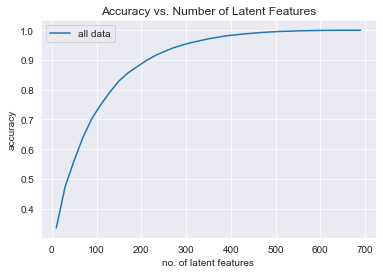

In [94]:
plt.plot(num_latent_feats, 1 - np.array(sum_errs)/df.shape[0], label='all data')
plt.xlabel('no. of latent features')
plt.ylabel('accuracy')
plt.title('Accuracy vs. Number of Latent Features')
plt.legend(loc='best');

`4.` From the above, we can't really be sure how many features to use, because simply having a better way to predict the 1's and 0's of the matrix doesn't exactly give us an indication of if we are able to make good recommendations.  Instead, we might split our dataset into a training and test set of data, as shown in the cell below.  

We use the code from question 3 to understand the impact on accuracy of the training and test sets of data with different numbers of latent features. Using the split below: 

* How many users can we make predictions for in the test set?  
* How many users are we not able to make predictions for because of the cold start problem?
* How many articles can we make predictions for in the test set?  
* How many articles are we not able to make predictions for because of the cold start problem?

In [95]:
df_train = df.head(40000)
df_test = df.tail(5993)

In [96]:
def create_test_and_train_user_item(df_train, df_test):
    '''
    Creates the training and testing datasets and handles the return parameters with build user-item matrix.
    
    Input:
        df_train - training dataframe
        df_test - test dataframe
    
    Output:
        user_item_train - a user-item matrix of the training dataframe 
                          (unique users for each row and unique articles for each column)
        user_item_test - a user-item matrix of the testing dataframe 
                        (unique users for each row and unique articles for each column)
        test_idx - all of the test user ids
        test_arts - all of the test article ids    
    '''
    
    user_item_train = create_user_item_matrix(df_train)
    user_item_test = create_user_item_matrix(df_test)

    test_idx = user_item_test.index
    test_arts = user_item_test.columns
    
    return user_item_train, user_item_test, test_idx, test_arts

In [97]:
user_item_train, user_item_test, test_idx, test_arts = create_test_and_train_user_item(df_train, df_test)

In [98]:
print("The training and testing datasets structure is:")
print(user_item_train.shape, user_item_test.shape)

The training and testing datasets structure is:
(4487, 714) (682, 574)


In [99]:
# 'How many users can we make predictions for in the test set?' - users must be in both sets;
# result is the value used to get the answer of the second question below: 682 - result of this part
train_idx = user_item_train.index
intersection = list(set(train_idx) & set(test_idx))
print("Intersection idx length of both sets: {}".format(len(intersection)))

Intersection idx length of both sets: 20


In [100]:
# Replace the values in the dictionary below
a = 662 
b = 574 
c = 20 
d = 0 

# my note: I changed the last 2 given dict key strings - replaced 'movies' by 'articles', in test file as well
# but that leads to KeyError even by saving the files and new import ???
sol_4_dict = {
    'How many users can we make predictions for in the test set?': c, 
    'How many users in the test set are we not able to make predictions for because of the cold start problem?': a, 
    'How many articles can we make predictions for in the test set?': b,
    'How many articles in the test set are we not able to make predictions for because of the cold start problem?': d
}

t.sol_4_test(sol_4_dict)

Awesome job!  That's right!  All of the test movies are in the training data, but there are only 20 test users that were also in the training set.  All of the other users that are in the test set we have no data on.  Therefore, we cannot make predictions for these users using SVD.


`5.` Now, we use the **user_item_train** dataset from above to find U, S, and V transpose using SVD. Then we find the subset of rows in the **user_item_test** dataset that we can predict using this matrix decomposition with different numbers of latent features to see how many features makes sense to keep based on the accuracy on the test data. This will require combining what was done in questions `2` - `4`.

We explore how well SVD works towards making predictions for recommendations on the test data.  

In [101]:
# fit SVD on the user_item_train matrix
# remember: again we don't have missing values, therefore the build-in svd function can be used
u_train, s_train, vt_train = np.linalg.svd(user_item_train)

In [102]:
print("How do our training set matrices u, s, vt look like now?")
print(u_train.shape, s_train.shape, vt_train.shape)

How do our training set matrices u, s, vt look like now?
(4487, 4487) (714,) (714, 714)


Now, we use the training decomposition to predict on our test data.

In [103]:
# create the test matrices for the users we can make predictions for:

# u_test
# we need the intersection of the index values of both sets - train and test matrices - as created above;
# we cannot use that idx list directly (having direct numbers, which may lead to an out-of-bounds IndexError); 
# we use: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#indexing-with-isin
# delivering an array with True and False values usable for indexing
intersection_idx = user_item_train.index.isin(test_idx)
u_test = u_train[intersection_idx, :]

# vt_train
# we have to create an intersection of the columns of both sets
intersection_clms = user_item_train.columns.isin(test_arts)
vt_test = vt_train[:, intersection_clms]

In [104]:
print("How do our test set matrices u, vt look like now?")
print(u_test.shape, vt_test.shape)

How do our test set matrices u, vt look like now?
(20, 4487) (714, 574)


We want to explore how the optimisation process of minimising the squared loss error is converging for all dataset combinations - means for training, testing and all data. As known, it depends on the number of latent features.

This recommendation concept works on the 20 identified users which are in the training and in the test datasets. For them we calculate predictions with the train_set SVD and compare this result with the test user-item matrix to get the mentioned error values.

In [105]:
# regarding the accuracy diagram above about all data, we can reduce the range of latent features,
# not realising accuracy improvements with higher values in the above diagram,
# at that diagram, at round about 500 latent features accuracy value 1 is reached.

num_latent_feats = np.arange(10,400+10,10)
all_errs = []
train_errs = []
test_errs = []

for k in num_latent_feats:
    # restructure with k latent features
    s_train_new, u_train_new, vt_train_new = np.diag(s_train[:k]), u_train[:, :k], vt_train[:k, :]
    u_test_new, vt_test_new = u_test[:, :k], vt_test[:k, :]
       
    # take dot product and calculate the overall error
    user_item_train_est = np.around(np.dot(np.dot(u_train_new, s_train_new), vt_train_new))
    user_item_test_est = np.around(np.dot(np.dot(u_test_new, s_train_new), vt_test_new))
    
    # compute error for each prediction to actual value and keep track of them;
    # this time for the training set, we have to use the existing index value numbers of the 20 users
    # as calculated before ('intersection' list of the assert test part above);
    # as error we sum the diffs of sum columns and rows
    train_diffs = np.subtract(user_item_train, user_item_train_est)
    test_diffs = np.subtract(user_item_test.loc[intersection, :], user_item_test_est)
    train_err = np.sum(np.sum(np.abs(train_diffs)))
    train_errs.append(train_err)
    test_err = np.sum(np.sum(np.abs(test_diffs))) 
    test_errs.append(test_err)
  
    # total errors and keep track of them
    all_errs.append(1-((np.sum(user_item_test_est)+np.sum(np.sum(user_item_test)))/(user_item_test.shape[0]*user_item_test.shape[1])))

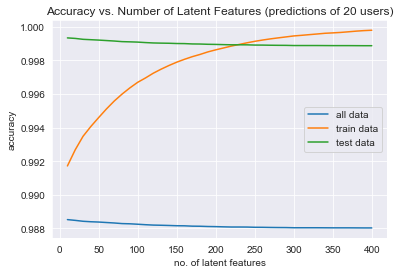

In [106]:
# plot errors learning curve diagram of all, training and test data
plt.plot(num_latent_feats, all_errs, label='all data');
plt.plot(num_latent_feats, 1 - (np.array(train_errs)/(user_item_train.shape[0]*user_item_train.shape[1])), label='train data');
plt.plot(num_latent_feats, 1 - (np.array(test_errs)/(user_item_test.shape[0]*user_item_test.shape[1])), label='test data');
plt.xlabel('no. of latent features')
plt.ylabel('accuracy')
plt.title('Accuracy vs. Number of Latent Features (predictions of 20 users)')
plt.legend(loc='best');

`6.` We comment on the resulting answer of the previous question. Given the circumstances of our results, we discuss what we might do to determine if the recommendations made with any of the above recommendation systems are an improvement to how users currently find articles? 

**Answer:**<br>
In general, having only 20 users for prediction and very small training and testing sample sets as well, the predictions and recommendations of this project implementation are not very confidential. Additionally, no real user article rating exists and the whole cold-start problem is not solved appropriately. For this project task, among other things content based rating is important to get the right popularity of an article. Overall, I would not trust the recommendation system results of this RS implementation.

Regarding metric performance, means the accuracy learning curve above, we see after latent features number round about 225, the training curve is higher compared to the testing one, means then overfitting exists. So, an improvement is expected by configuration of a lower number of latent features. To get the best value a cross-validation concept should be added.

Even having a visible accuracy improvement by using SVD with Matrix Factorisation and lower range of latent features on training and testing sets compared to the accuracy distribution of all data, more advanced, sophisticated strategies should be used to implement such kind of recommender system.

As further improvement, e.g. Gaurav Sharma introduced and explained in his medium blog post [How to Build a Recommender System (RS)](https://medium.com/datadriveninvestor/how-to-built-a-recommender-system-rs-616c988d64b2) another key performance indicator and additional hyperparameters to avoid overfitting. 

As he wrote in his blog post:<br>
"We just thought of user-bias and item-bias and incorporated both of them into our formulation. This is the advantage of optimization on matrix factorization. It would not be possible on user-user and item-item similarity.

In the actual [research paper](https://datajobs.com/data-science-repo/Recommender-Systems-%5bNetflix%5d.pdf), which winners of Netflix prize wrote, they extend this further and commented that “ratings by users and for items are time dependent”. Therefore, they made rating, user-bias and item-bias r_ui(t), bu(t) & bi(t) respectively as a function of time."

In [107]:
# see: https://docs.python.org/3/library/subprocess.html
# for creating a .html file of this notebook, 0 is returned after successful conversion
# from subprocess import call
call(['python', '-m', 'nbconvert', 'Recommendations_with_IBM.ipynb'])

0